# Breeding Site Detection Demo

In [2]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import time

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from glob import glob
from tqdm import tqdm_notebook

In [3]:
# This is needed to display the images.
%matplotlib inline

# This is needed since the notebook is stored in the object_detection folder.
sys.path.insert(0, os.path.abspath('..'))

In [4]:
from utils import label_map_util

from utils import visualization_utils as vis_util

In [5]:
MODEL_NAME = 'dengue_inference_graph'

PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph_v3.pb'

PATH_TO_LABELS = os.path.join('dengue_inference_graph', 'dengue_label_map.pbtxt')

NUM_CLASSES = 9
IMAGE_SIZE = (15, 15)

## Load a (frozen) Tensorflow model into memory.

In [6]:
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine

In [7]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
category_index

{1: {'id': 1, 'name': 'bin'},
 2: {'id': 2, 'name': 'bowl'},
 3: {'id': 3, 'name': 'bucket'},
 4: {'id': 4, 'name': 'car'},
 5: {'id': 5, 'name': 'cup'},
 6: {'id': 6, 'name': 'jar'},
 7: {'id': 7, 'name': 'pottedplant'},
 8: {'id': 8, 'name': 'tire'},
 9: {'id': 9, 'name': 'vase'}}

## Helper code

In [8]:
def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

In [9]:
def testing(TEST_IMAGE_PATHS, sub_x, sub_y):
    fig = plt.figure(figsize=(25,100))
    with detection_graph.as_default():
        with tf.Session(graph=detection_graph) as sess:
            # Definite input and output Tensors for detection_graph
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            # Each box represents a part of the image where a particular object was detected.
            detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
            # Each score represent how level of confidence for each of the objects.
            # Score is shown on the result image, together with the class label.
            detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
            detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
            num_detections = detection_graph.get_tensor_by_name('num_detections:0')
            
            for i, image_path in tqdm_notebook(enumerate(TEST_IMAGE_PATHS)):
                start = time.time()
                image = Image.open(image_path)
                # the array based representation of the image will be used later in order to prepare the
                # result image with boxes and labels on it.
                image_np = load_image_into_numpy_array(image)
                # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
                image_np_expanded = np.expand_dims(image_np, axis=0)
                # Actual detection.
                (boxes, scores, classes, num) = sess.run(
                  [detection_boxes, detection_scores, detection_classes, num_detections],
                  feed_dict={image_tensor: image_np_expanded})
                end = time.time()
                # Visualization of the results of a detection.
                vis_util.visualize_boxes_and_labels_on_image_array(
                    image_np,
                    np.squeeze(boxes),
                    np.squeeze(classes).astype(np.int32),
                    np.squeeze(scores),
                    category_index,
                    use_normalized_coordinates=True,
                    line_thickness=5,
                    min_score_thresh=0.5)

#                 print(str(end-start)[:-10],'seconds')
                plt.subplot(sub_y, sub_x, i+1)
                plt.title(image_path)
                plt.imshow(image_np)
                plt.axis('off')
    plt.tight_layout()
    return plt.show()

In [10]:
# tires = glob('test_images/tire_*')
# testing(tires[:16], sub_x=4, sub_y=4)

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

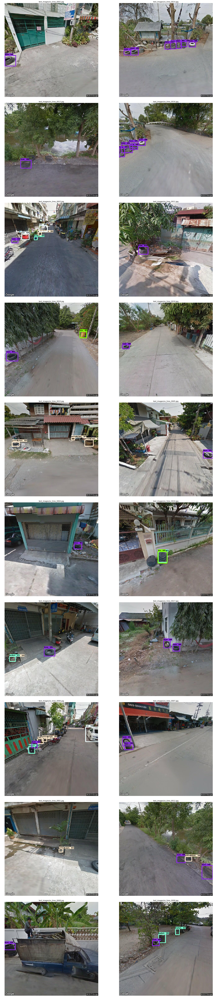

In [11]:
tires = glob('test_images/sv_tires*')
testing(tires[:20], sub_x=2, sub_y=10)

HBox(children=(IntProgress(value=1, bar_style=u'info', max=1), HTML(value=u'')))

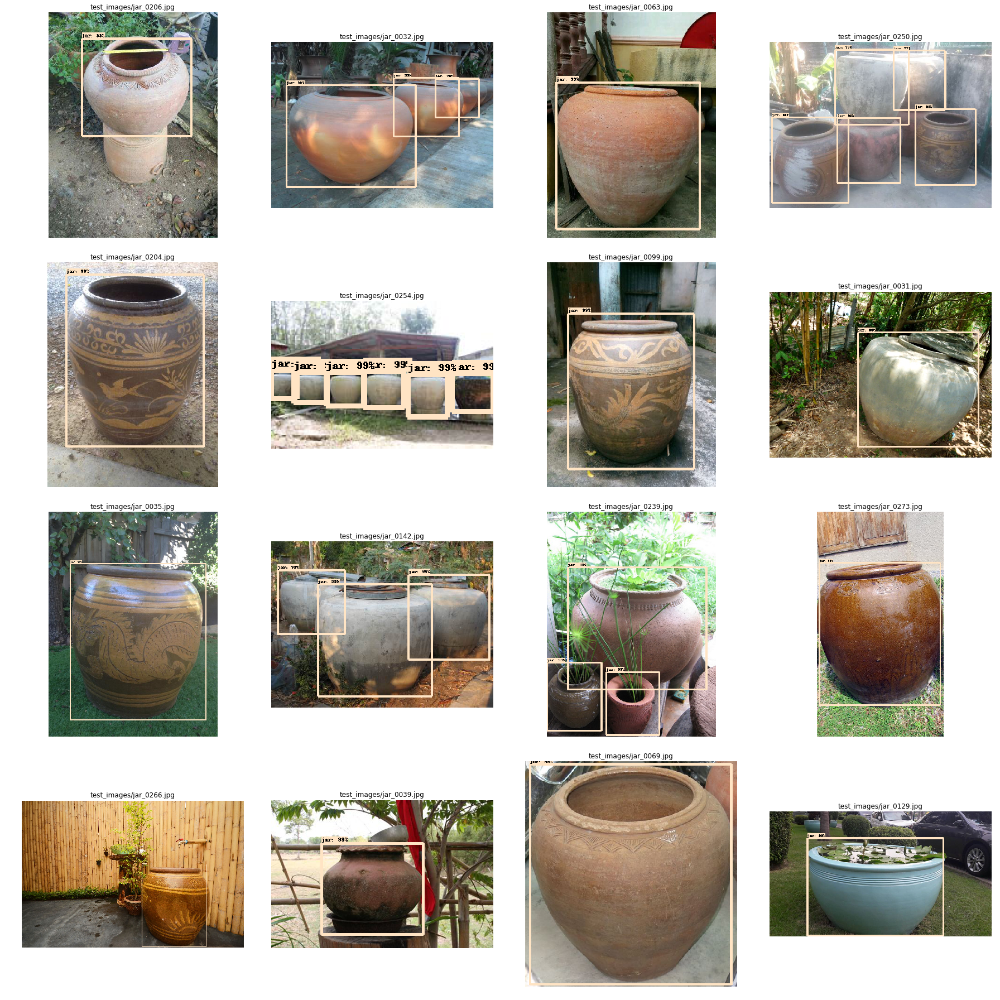

In [21]:
jars = glob('test_images/jar_*')
testing(jars[:16], sub_x=4, sub_y=4)